In [1]:
import os
import sys
sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

/home/cjw/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmCompensatedTifs"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish5_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_Ice.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish5_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_CCB.mm', '/media/cjw/Data/cyto/mmComp

dict_keys(['Fish4_Untreated.mm', 'Fish3_CCB.mm', 'Fish4_CCB.mm', 'Fish1_Untreated.mm', 'Fish2_ICE.mm', 'Fish2_CCB.mm', 'Fish5_CCB.mm', 'Fish1_Ice.mm', 'Fish6_CCB.mm', 'Fish3_Untreated.mm', 'Fish4_ICE.mm', 'Fish6_ICE.mm', 'Fish3_ICE.mm', 'Fish6_Untreated.mm', 'Fish2_Untreated.mm', 'Fish5_Untreated.mm', 'Fish1_CCB.mm', 'Fish5_ICE.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


Encoder True
Tensor("Placeholder:0", shape=(?, 32, 32, 4), dtype=float32) (?, 32, 32, 4)
Tensor("latent_space/BiasAdd:0", shape=(?, 256), dtype=float32)
isize:  4 32
Tensor("Sigmoid:0", shape=(?, 32, 32, 4), dtype=float32)
180000 1406 128
179488 512
Epoch:  0 Iteration:  0 Loss:  419.31555 0.16023569 2.4510453


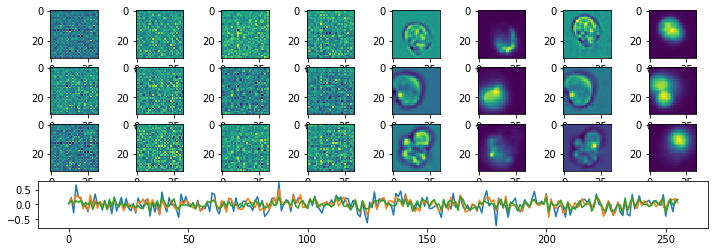

Epoch:  0 Iteration:  500 Loss:  45.886 14.854112 3.3380992


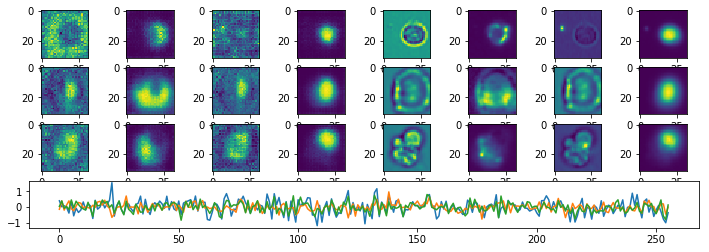

Epoch:  0 Iteration:  1000 Loss:  32.17484 12.208961 2.381191


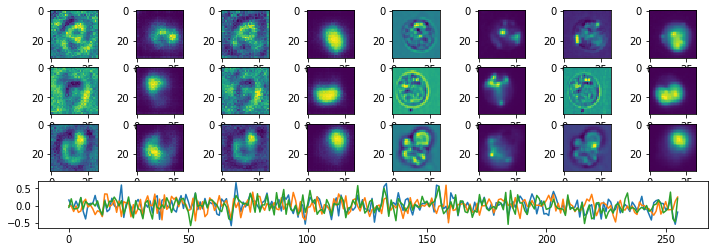

Epoch:  1 Iteration:  0 Loss:  26.26741 14.965729 2.0462842


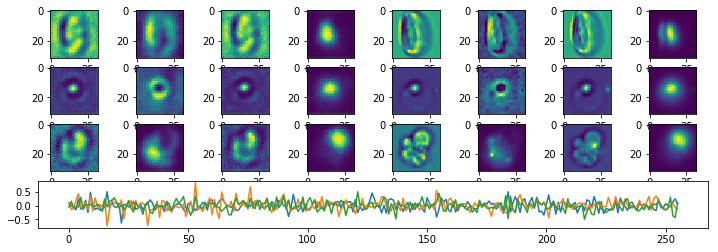

Epoch:  1 Iteration:  500 Loss:  22.068575 19.116024 1.8116279


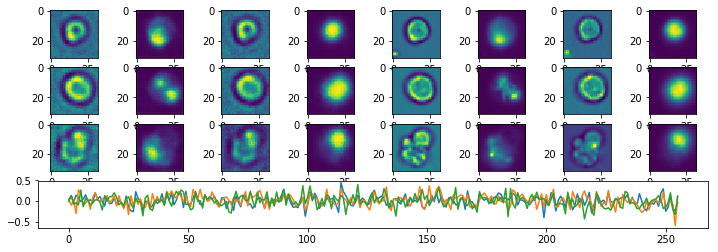

Epoch:  1 Iteration:  1000 Loss:  19.91446 12.961884 1.5367825


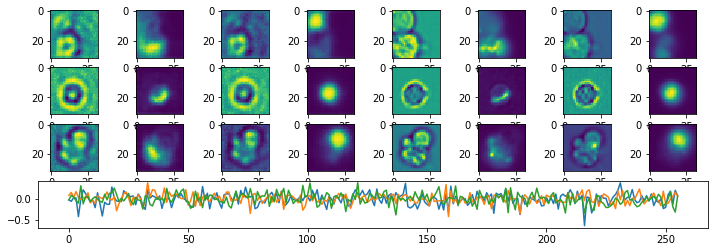

Epoch:  2 Iteration:  0 Loss:  19.51513 12.4128065 1.3899993


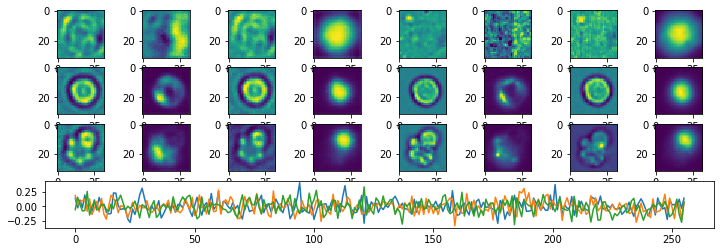

Epoch:  2 Iteration:  500 Loss:  17.424585 10.396121 1.3049881


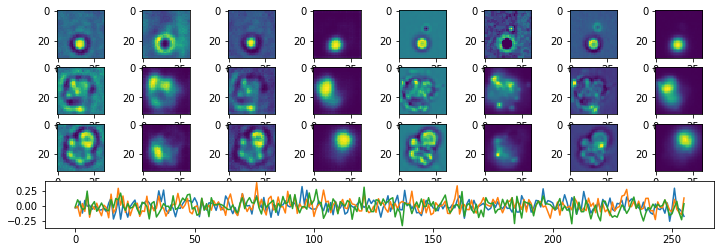

Epoch:  2 Iteration:  1000 Loss:  16.400808 14.378666 1.191803


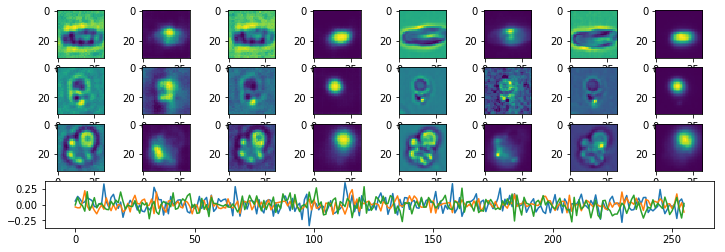

Epoch:  3 Iteration:  0 Loss:  14.1102495 19.620337 1.1288733


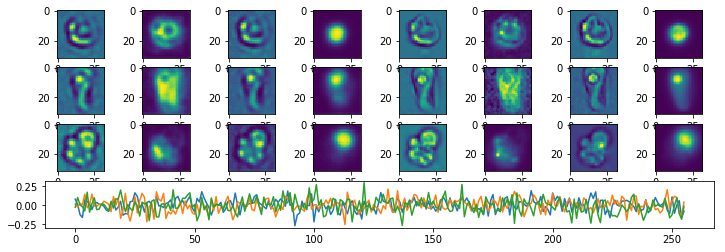

Epoch:  3 Iteration:  500 Loss:  13.663179 19.290709 1.0238248


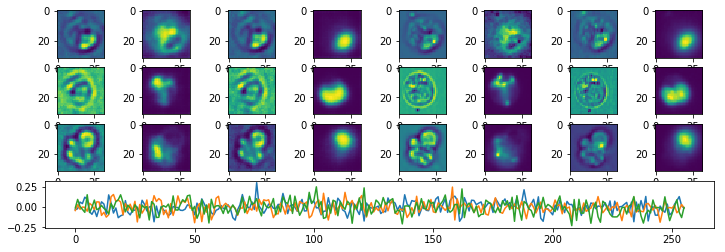

Epoch:  3 Iteration:  1000 Loss:  13.28657 16.826727 0.98552734


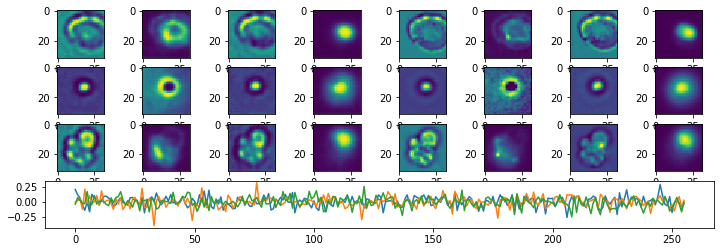

Epoch:  4 Iteration:  0 Loss:  12.580741 21.030832 0.9430328


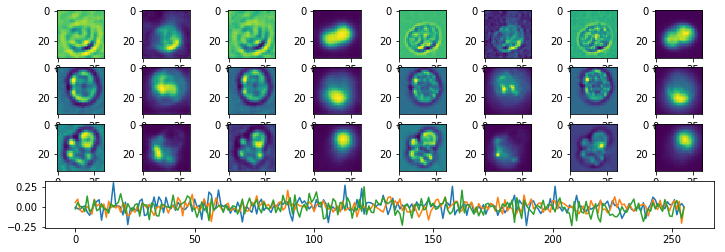

Epoch:  4 Iteration:  500 Loss:  12.135806 19.47952 0.9322195


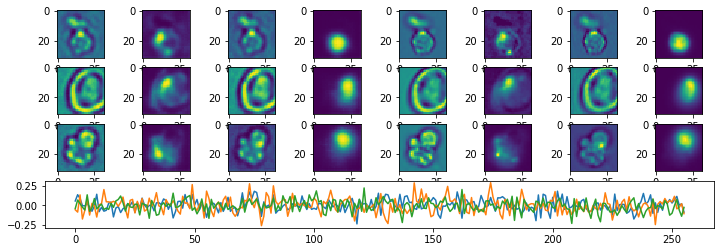

Epoch:  4 Iteration:  1000 Loss:  11.898639 20.054531 0.9175322


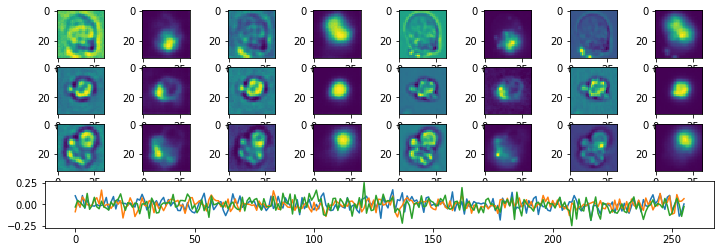

Epoch:  5 Iteration:  0 Loss:  10.69947 22.130241 0.83949953


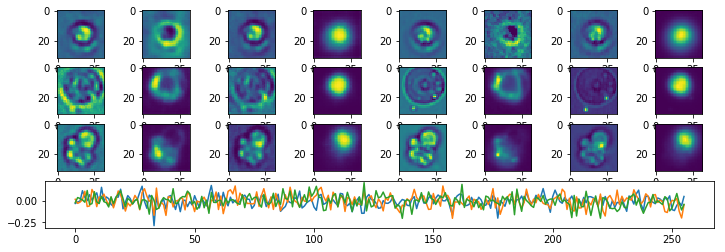

Epoch:  5 Iteration:  500 Loss:  10.120923 22.230497 0.81516665


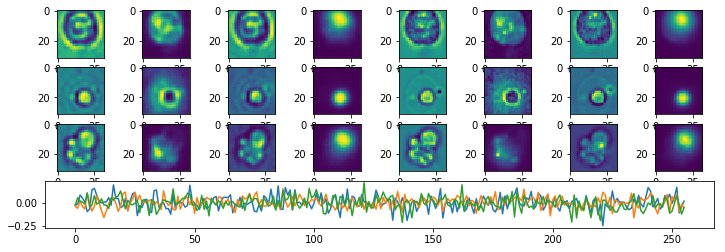

Epoch:  5 Iteration:  1000 Loss:  10.850424 20.568037 0.7889047


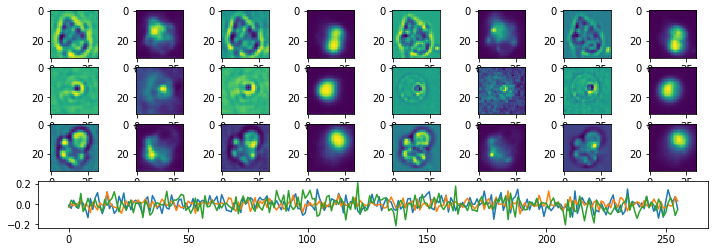

Epoch:  6 Iteration:  0 Loss:  10.431273 19.514435 0.7668481


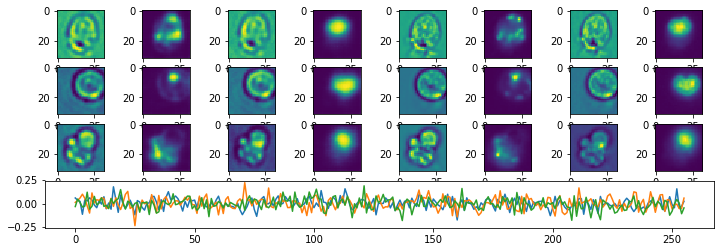

Epoch:  6 Iteration:  500 Loss:  9.561629 20.823277 0.7378805


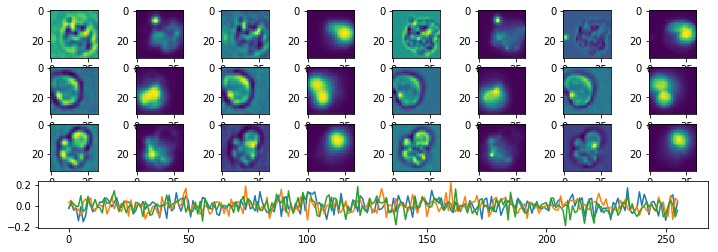

Epoch:  6 Iteration:  1000 Loss:  8.522424 24.235716 0.7153953


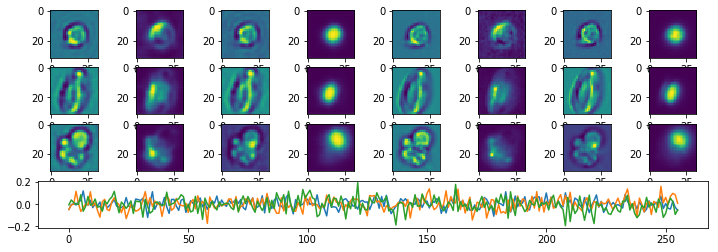

Epoch:  7 Iteration:  0 Loss:  8.502759 30.64142 0.71195406


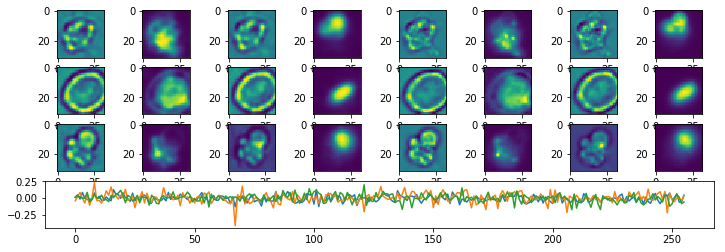

Epoch:  7 Iteration:  500 Loss:  8.219564 22.687262 0.66677475


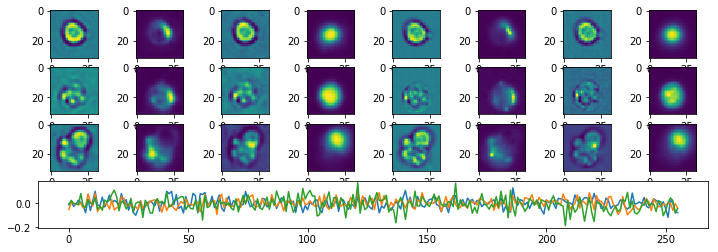

Epoch:  7 Iteration:  1000 Loss:  8.692255 22.657484 0.6599819


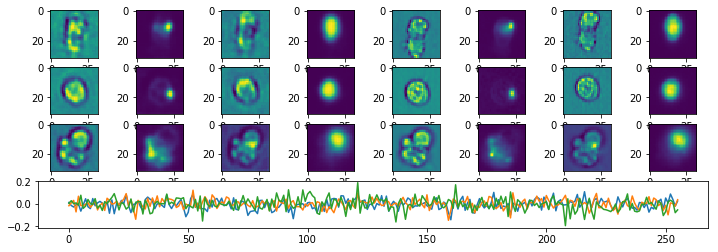

Epoch:  8 Iteration:  0 Loss:  8.923071 21.347725 0.6594644


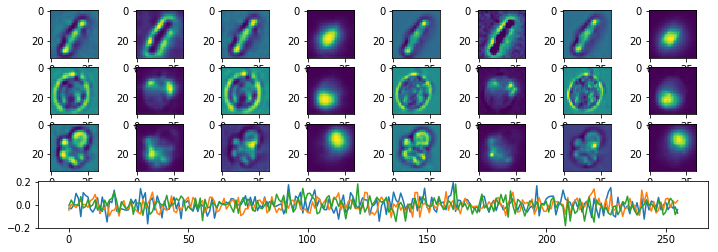

Epoch:  8 Iteration:  500 Loss:  8.433254 15.804839 0.6283901


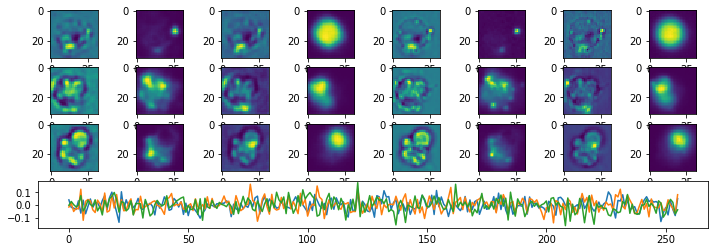

Epoch:  8 Iteration:  1000 Loss:  8.155623 18.748331 0.5945977


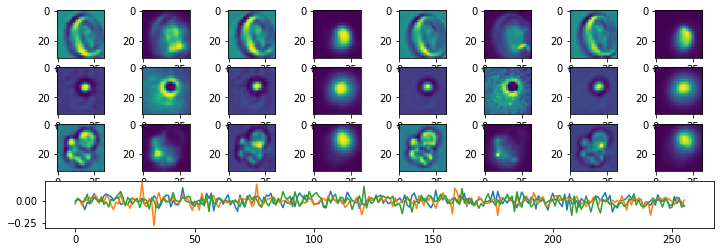

Epoch:  9 Iteration:  0 Loss:  8.181483 15.662008 0.595315


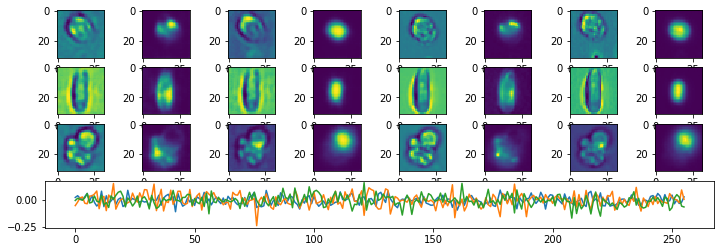

Epoch:  9 Iteration:  500 Loss:  7.619417 25.404985 0.59323835


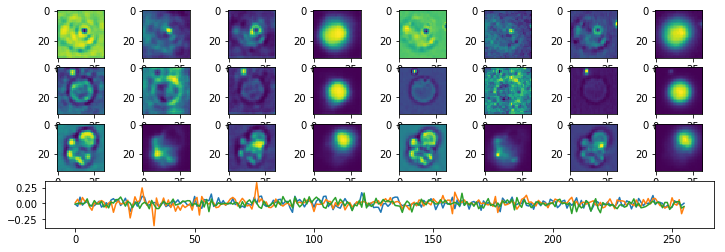

Epoch:  9 Iteration:  1000 Loss:  7.371216 20.428295 0.56982756


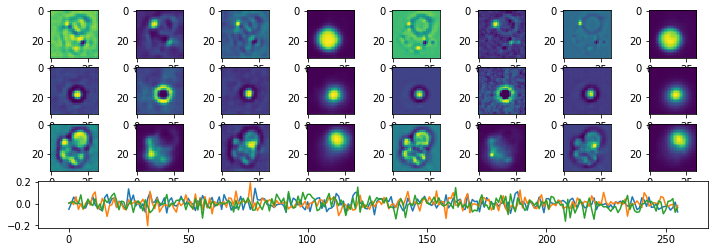

Epoch:  10 Iteration:  0 Loss:  7.370715 20.585276 0.5717755


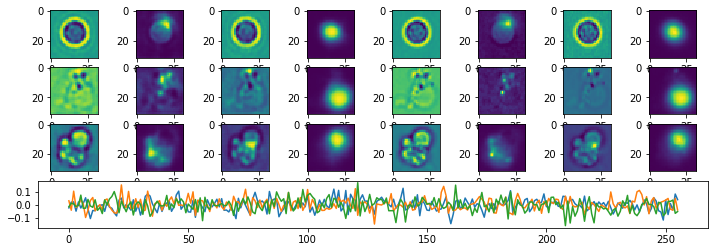

Epoch:  10 Iteration:  500 Loss:  8.04018 20.098167 0.5475734


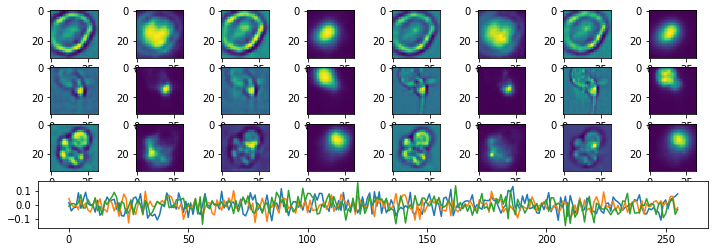

Epoch:  10 Iteration:  1000 Loss:  6.8956404 25.216846 0.543792


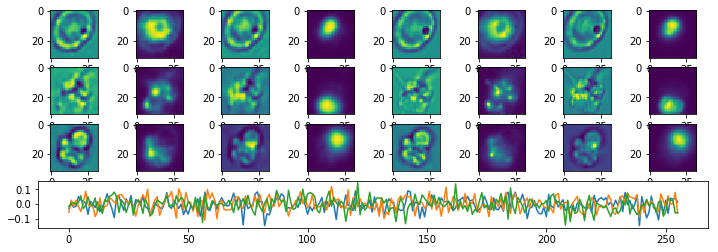

Epoch:  11 Iteration:  0 Loss:  7.6367316 16.82797 0.5410129


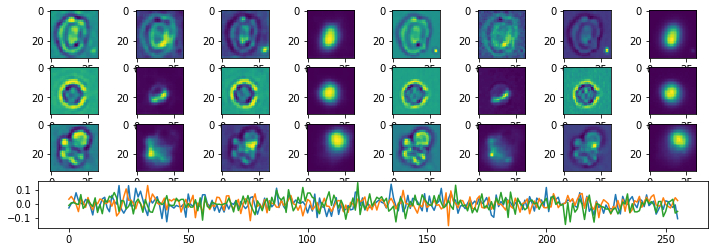

Epoch:  11 Iteration:  500 Loss:  6.5289693 27.17009 0.53106725


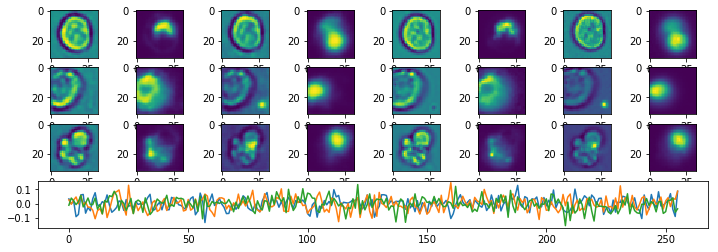

Epoch:  11 Iteration:  1000 Loss:  6.475302 23.344425 0.5133961


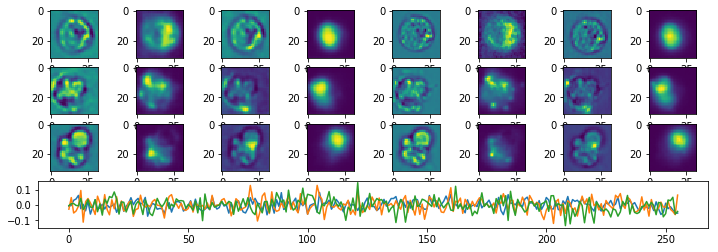

Epoch:  12 Iteration:  0 Loss:  6.652507 20.85308 0.52764016


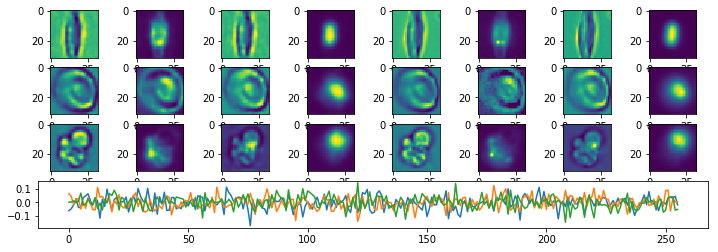

Epoch:  12 Iteration:  500 Loss:  7.1061115 16.799213 0.5023244


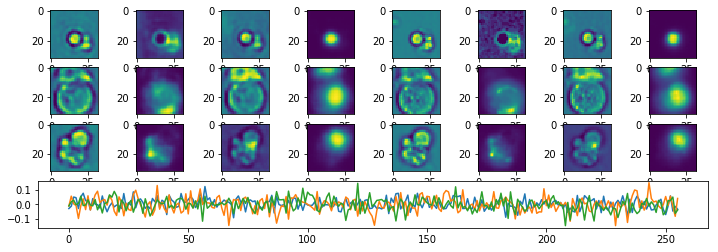

Epoch:  12 Iteration:  1000 Loss:  6.173739 25.455421 0.49585652


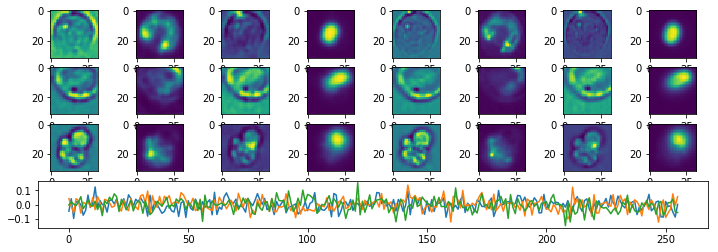

Epoch:  13 Iteration:  0 Loss:  6.8705482 20.795477 0.502606


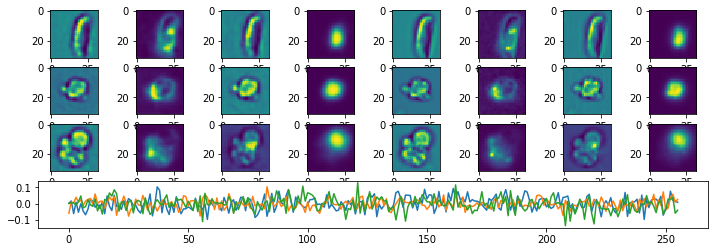

Epoch:  13 Iteration:  500 Loss:  6.4360886 18.600769 0.4865724


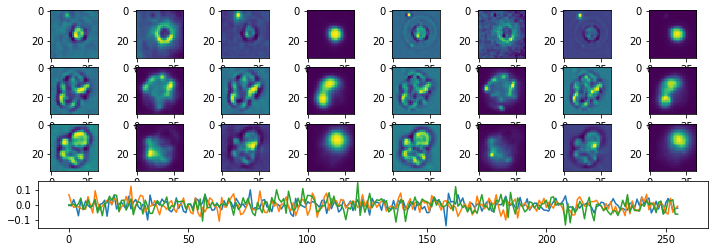

Epoch:  13 Iteration:  1000 Loss:  6.9226356 17.118744 0.47402054


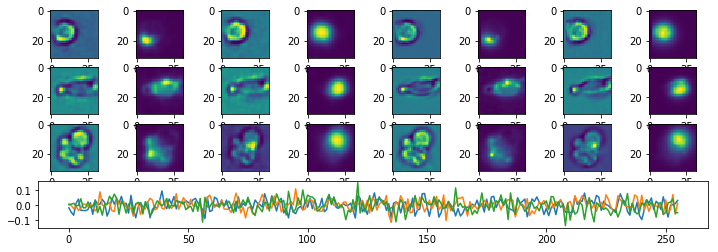

Epoch:  14 Iteration:  0 Loss:  6.124038 21.41106 0.4837461


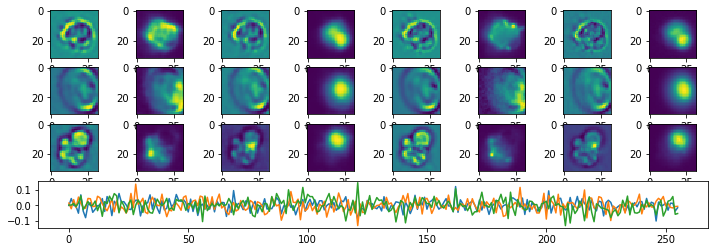

Epoch:  14 Iteration:  500 Loss:  6.4724736 17.928375 0.46541983


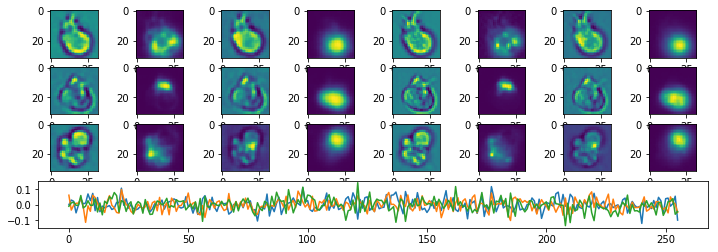

Epoch:  14 Iteration:  1000 Loss:  7.143811 21.16625 0.45277584


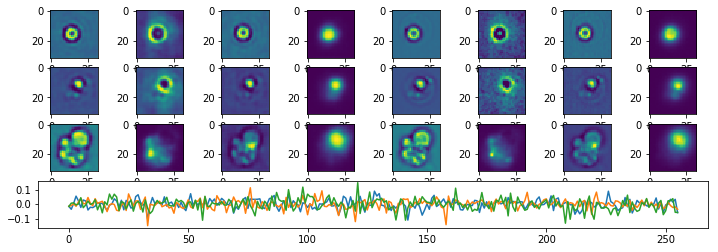

Epoch:  15 Iteration:  0 Loss:  5.6988983 24.623444 0.45734793


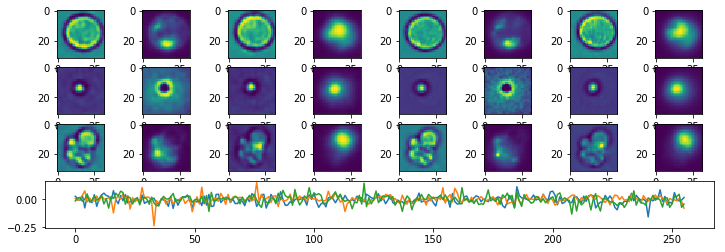

Epoch:  15 Iteration:  500 Loss:  6.555212 17.782219 0.45012793


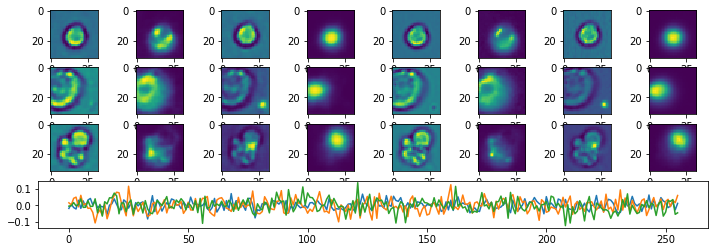

Epoch:  15 Iteration:  1000 Loss:  5.88454 19.274204 0.43420503


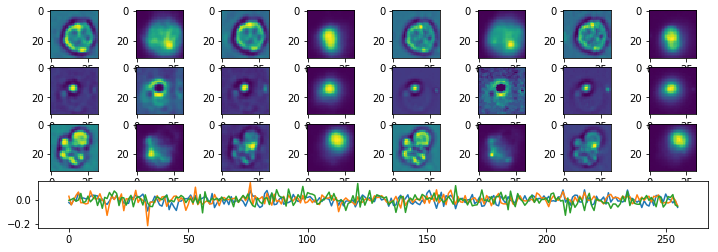

Epoch:  16 Iteration:  0 Loss:  5.8089285 24.851286 0.44941318


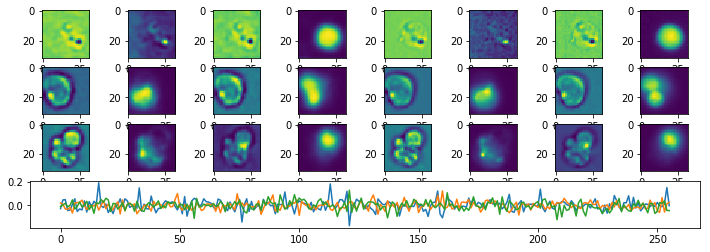

Epoch:  16 Iteration:  500 Loss:  5.6471577 20.611546 0.43859908


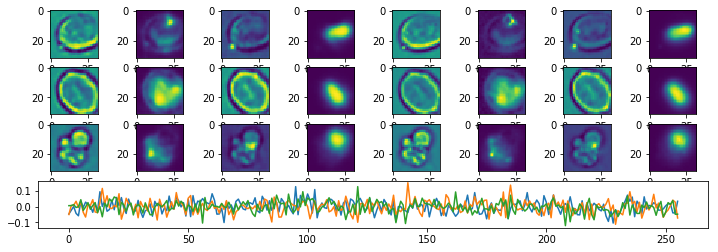

Epoch:  16 Iteration:  1000 Loss:  5.834793 25.566517 0.43636087


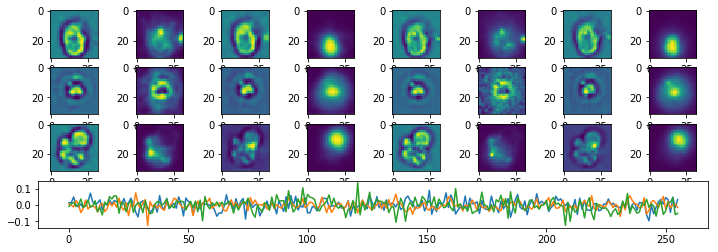

Epoch:  17 Iteration:  0 Loss:  5.1835446 24.438662 0.43319926


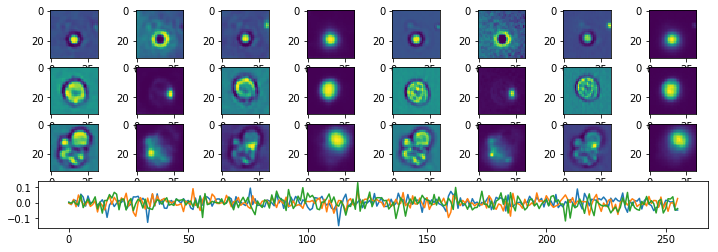

Epoch:  17 Iteration:  500 Loss:  5.745118 22.224686 0.41960546


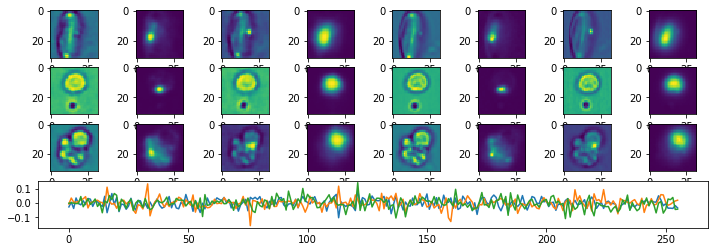

Epoch:  17 Iteration:  1000 Loss:  6.0980525 17.73034 0.4127063


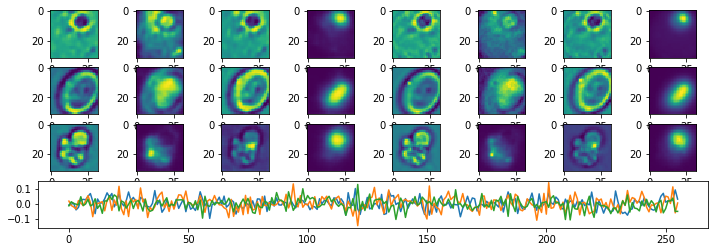

Epoch:  18 Iteration:  0 Loss:  5.997566 19.623808 0.41479558


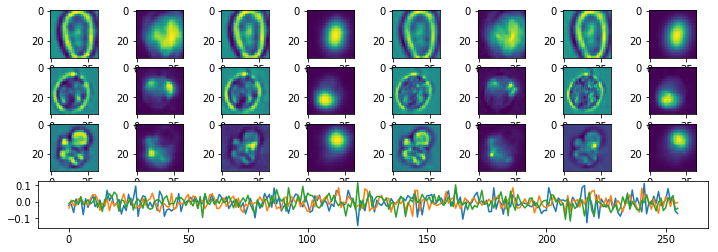

Epoch:  18 Iteration:  500 Loss:  5.2687683 24.215174 0.39791584


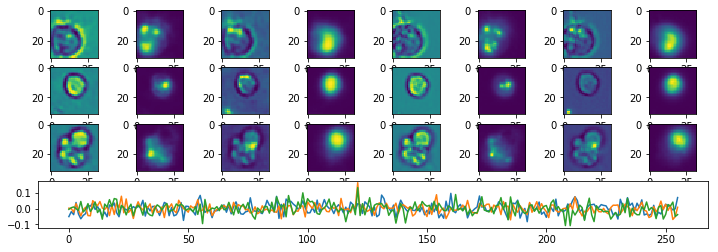

Epoch:  18 Iteration:  1000 Loss:  5.1687307 22.465797 0.41310975


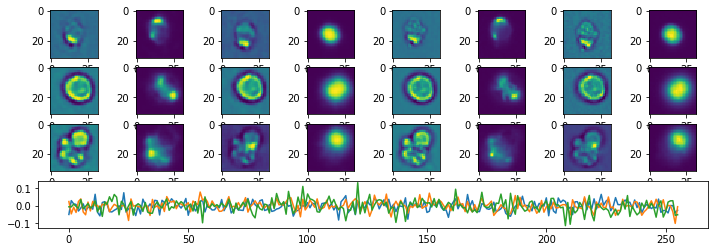

Epoch:  19 Iteration:  0 Loss:  5.651258 17.693882 0.38559297


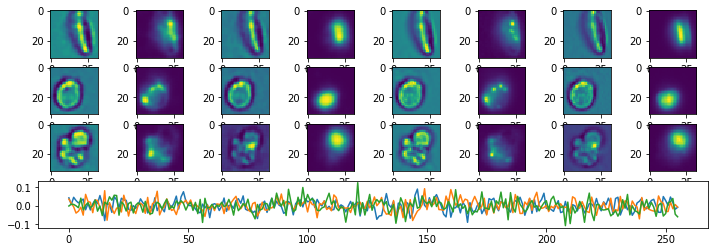

Epoch:  19 Iteration:  500 Loss:  5.483637 28.285976 0.4104917


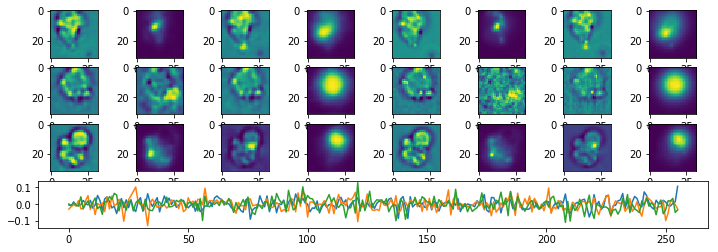

Epoch:  19 Iteration:  1000 Loss:  4.5348606 25.272408 0.38564792


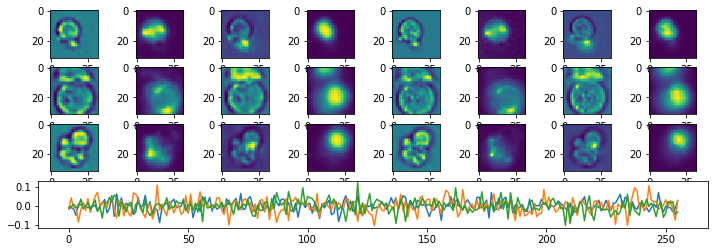

Epoch:  20 Iteration:  0 Loss:  6.264451 19.97178 0.39343837


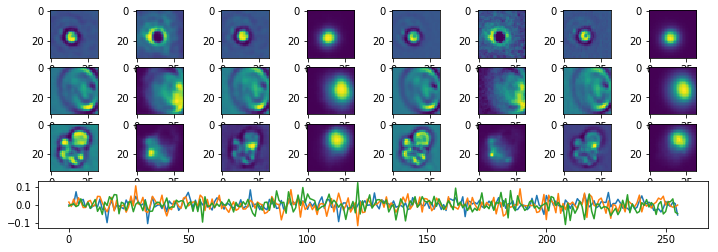

Epoch:  20 Iteration:  500 Loss:  5.5485187 20.150137 0.38191032


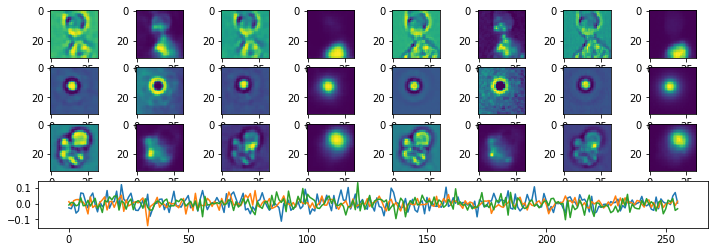

Epoch:  20 Iteration:  1000 Loss:  5.985751 15.624271 0.38007483


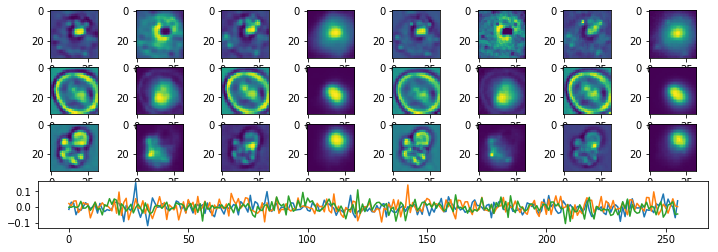

Epoch:  21 Iteration:  0 Loss:  5.1118755 23.208145 0.37413782


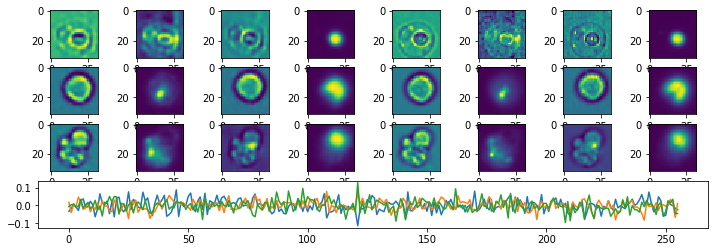

Epoch:  21 Iteration:  500 Loss:  5.3118324 21.317562 0.37220535


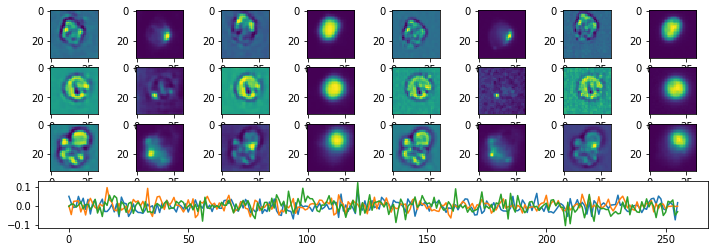

Epoch:  21 Iteration:  1000 Loss:  5.0720377 26.81218 0.37116018


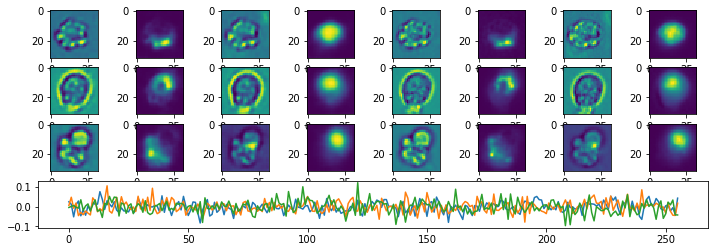

Epoch:  22 Iteration:  0 Loss:  5.3462934 26.254642 0.37195176


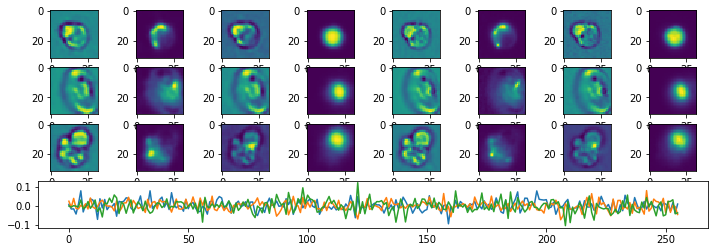

Epoch:  22 Iteration:  500 Loss:  4.861823 22.875683 0.3639171


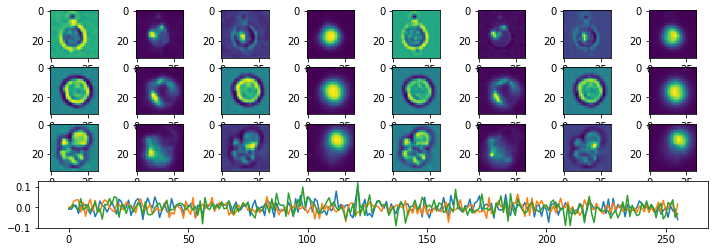

Epoch:  22 Iteration:  1000 Loss:  4.8404026 21.22636 0.3528866


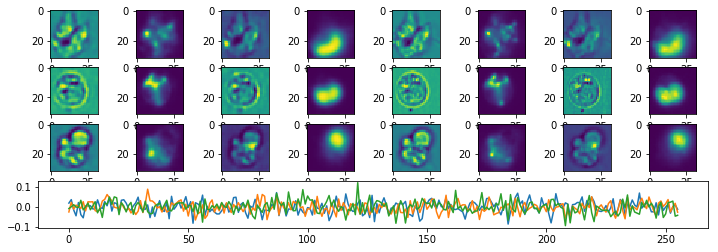

Epoch:  23 Iteration:  0 Loss:  4.0105267 33.109756 0.35741773


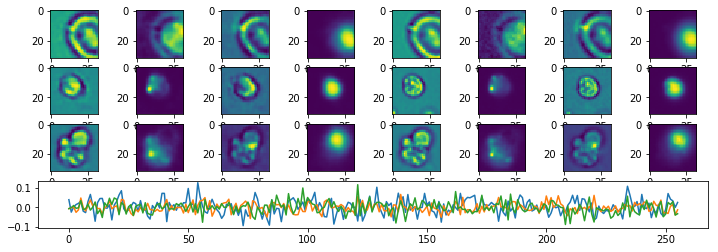

Epoch:  23 Iteration:  500 Loss:  5.3331385 21.878487 0.35362014


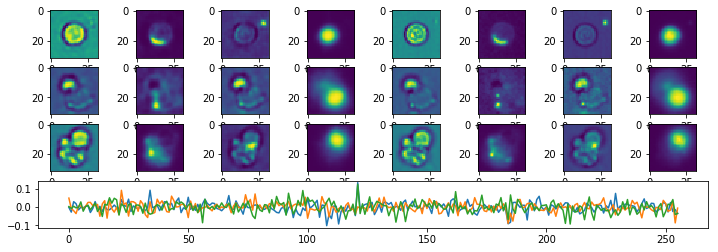

Epoch:  23 Iteration:  1000 Loss:  5.9876323 15.238504 0.34781036


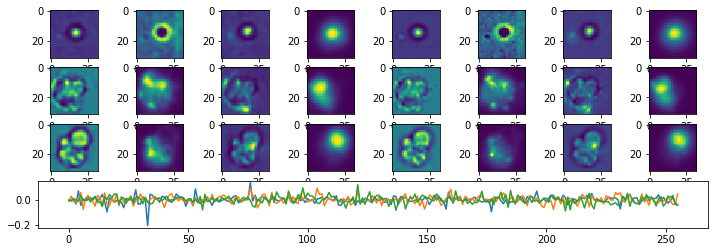

Epoch:  24 Iteration:  0 Loss:  4.943842 21.0108 0.3346312


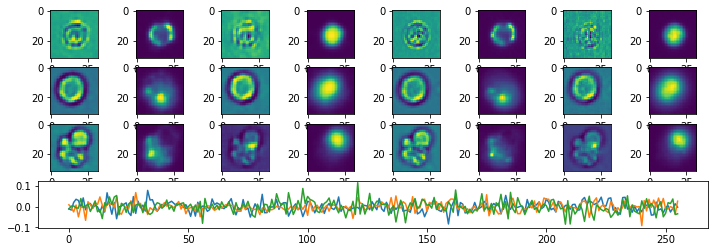

Epoch:  24 Iteration:  500 Loss:  5.0131054 20.863188 0.3525163


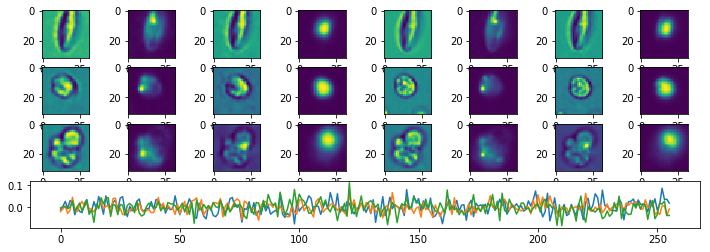

Epoch:  24 Iteration:  1000 Loss:  4.878106 24.40716 0.33118966


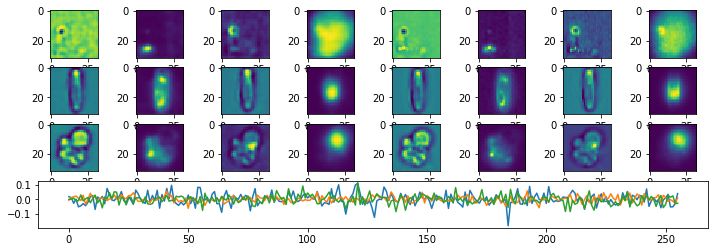

Epoch:  25 Iteration:  0 Loss:  5.1203556 21.200356 0.34400576


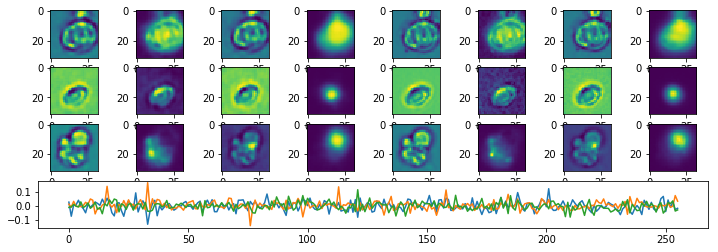

Epoch:  25 Iteration:  500 Loss:  4.916009 22.002468 0.32311353


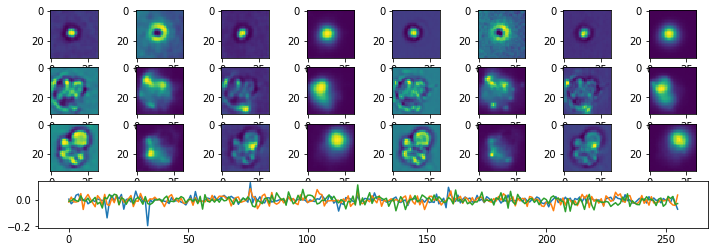

Epoch:  25 Iteration:  1000 Loss:  5.6723523 14.617449 0.3254529


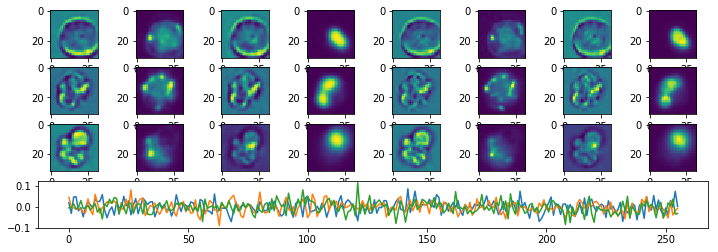

Epoch:  26 Iteration:  0 Loss:  4.1500974 24.899353 0.32841396


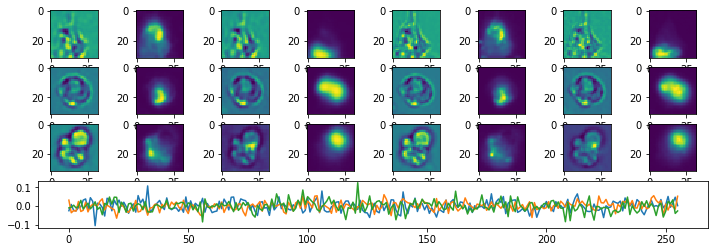

Epoch:  26 Iteration:  500 Loss:  4.4174576 29.4802 0.32904264


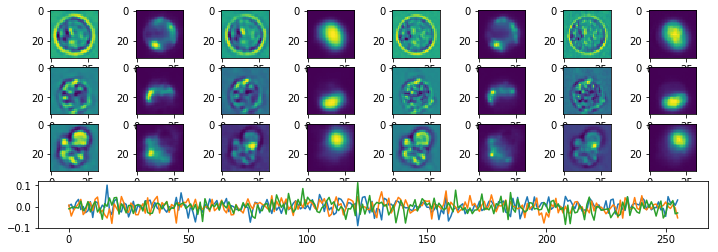

Epoch:  26 Iteration:  1000 Loss:  4.867134 21.465551 0.32954714


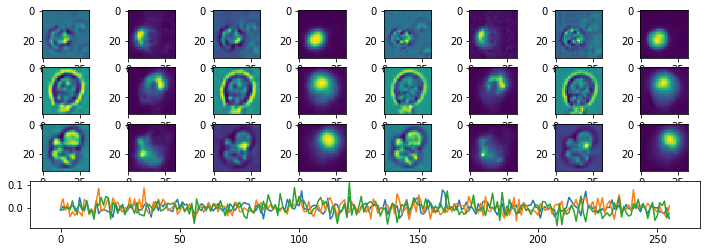

Epoch:  27 Iteration:  0 Loss:  4.41311 25.469887 0.3241849


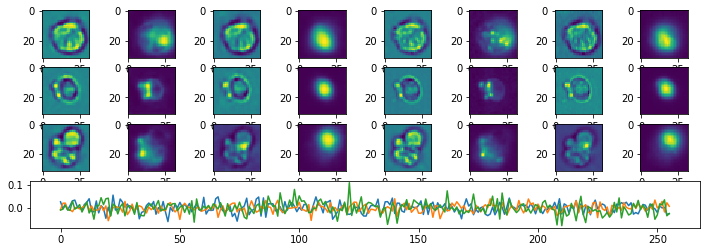

Epoch:  27 Iteration:  500 Loss:  4.575735 25.691025 0.3304134


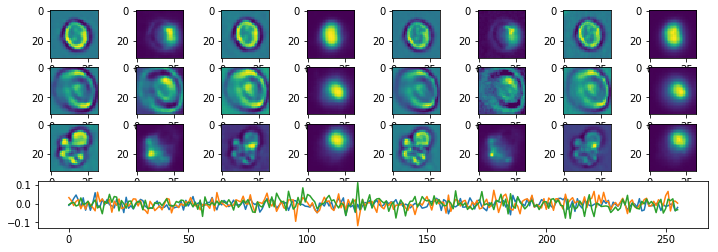

Epoch:  27 Iteration:  1000 Loss:  5.164303 20.363165 0.31537235


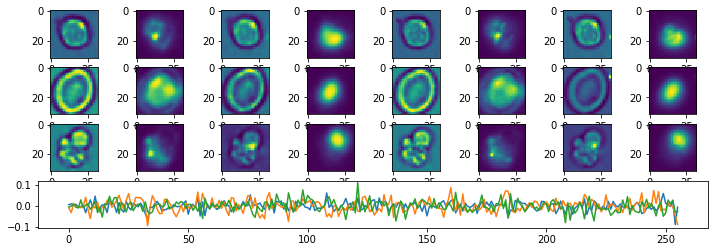

Epoch:  28 Iteration:  0 Loss:  4.735669 20.373116 0.30964947


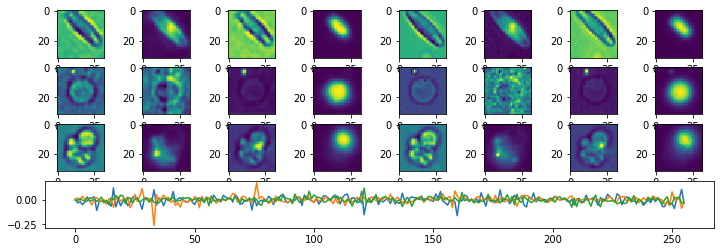

Epoch:  28 Iteration:  500 Loss:  4.812208 21.751057 0.3121134


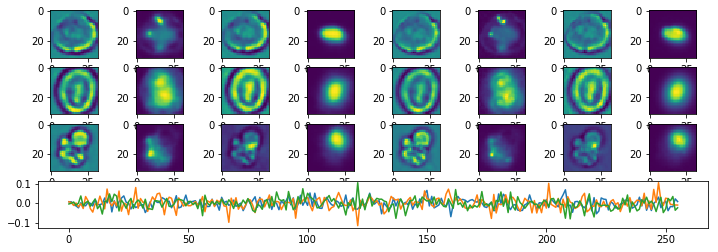

Epoch:  28 Iteration:  1000 Loss:  4.367814 26.628988 0.31346378


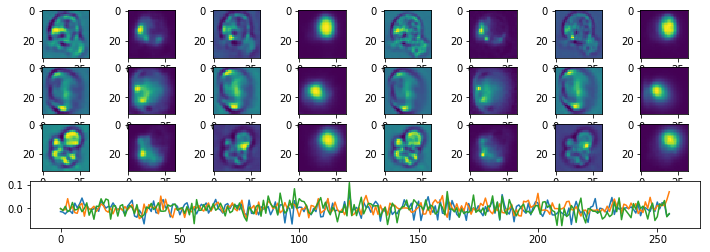

Epoch:  29 Iteration:  0 Loss:  4.9102273 18.03163 0.30515593


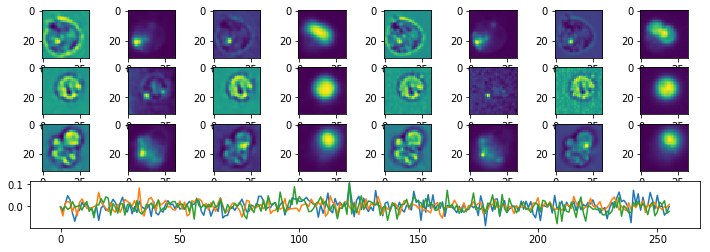

Epoch:  29 Iteration:  500 Loss:  4.7509956 23.820904 0.31386957


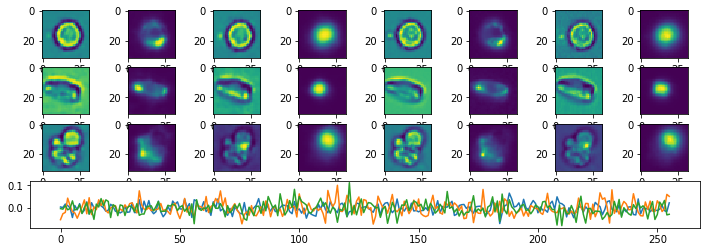

Epoch:  29 Iteration:  1000 Loss:  4.6395655 20.407272 0.30025852


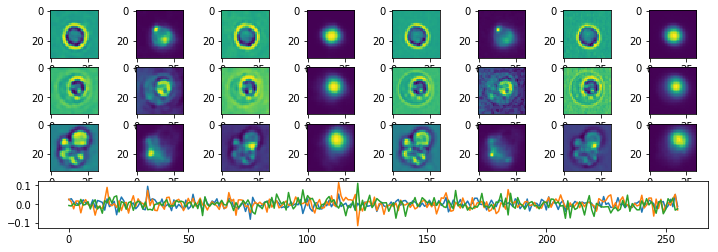

Epoch:  30 Iteration:  0 Loss:  3.4189615 30.72865 0.2968022


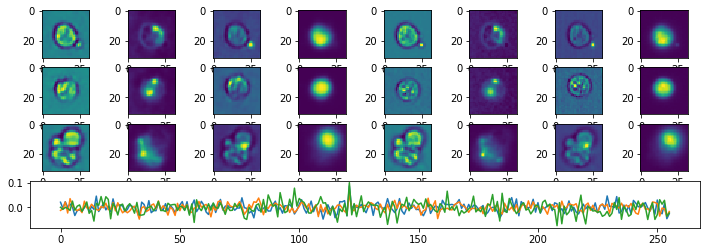

Epoch:  30 Iteration:  500 Loss:  4.318116 24.085735 0.29394776


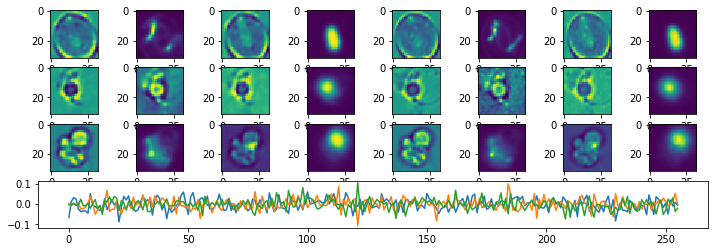

Epoch:  30 Iteration:  1000 Loss:  4.5245237 21.836088 0.29512528


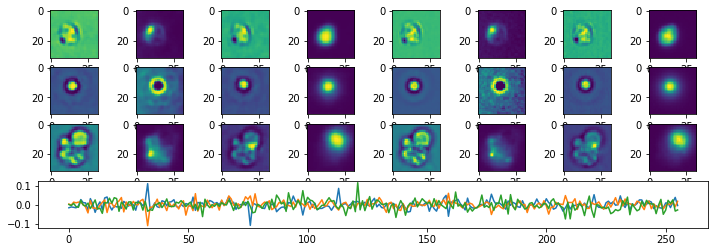

Epoch:  31 Iteration:  0 Loss:  4.146031 22.813791 0.2912965


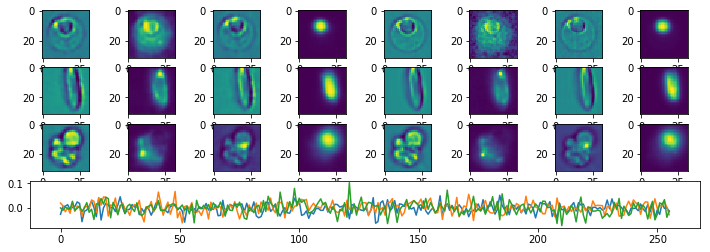

Epoch:  31 Iteration:  500 Loss:  3.8657537 25.188107 0.29147705


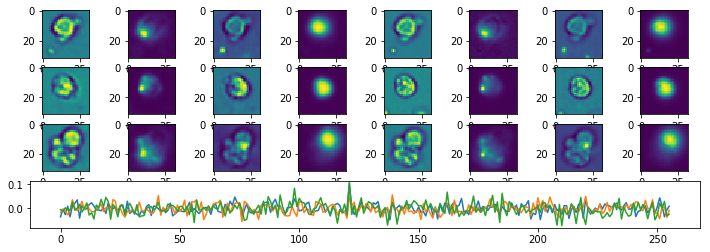

Epoch:  31 Iteration:  1000 Loss:  4.960881 16.608849 0.28952083


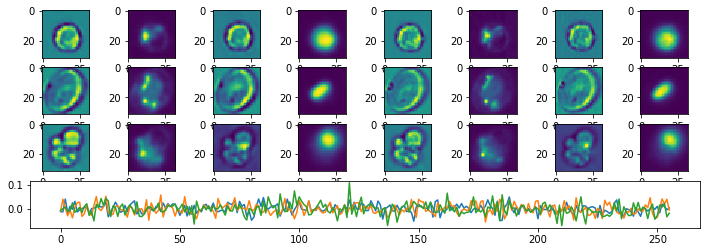

Epoch:  32 Iteration:  0 Loss:  3.6541367 25.53319 0.2900498


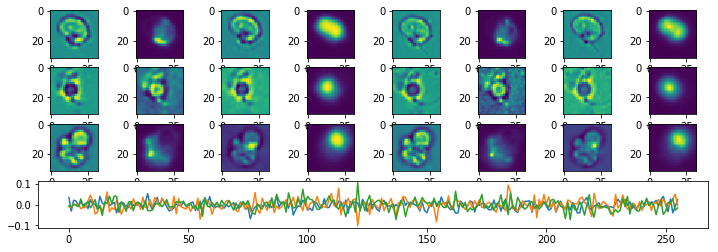

Epoch:  32 Iteration:  500 Loss:  6.0451794 23.343887 0.40481943


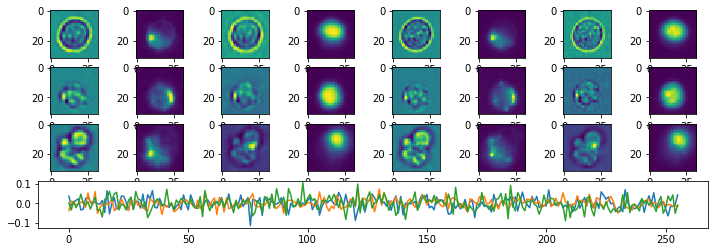

Epoch:  32 Iteration:  1000 Loss:  5.3118296 20.1051 0.37356082


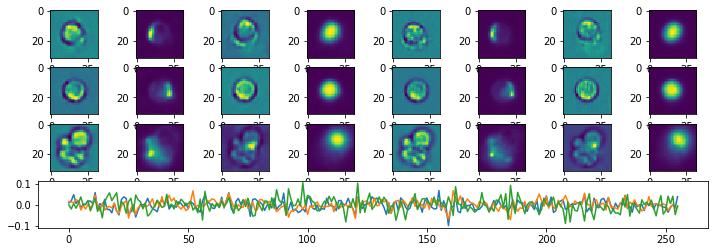

Epoch:  33 Iteration:  0 Loss:  4.915632 22.786808 0.36576977


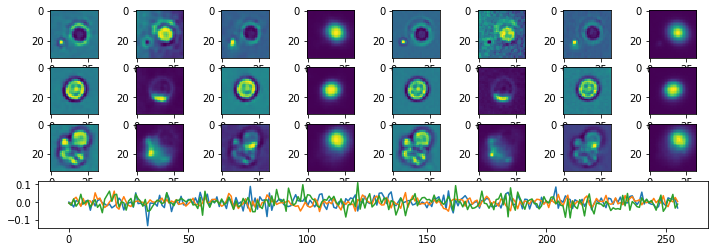

Epoch:  33 Iteration:  500 Loss:  4.5682564 21.738155 0.33702725


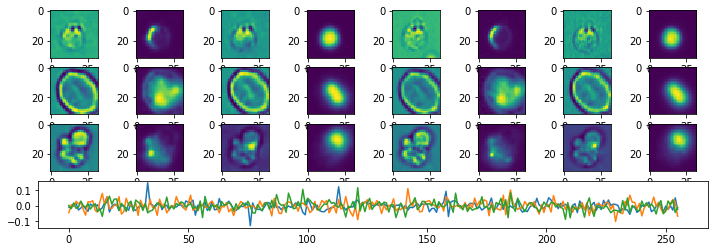

Epoch:  33 Iteration:  1000 Loss:  4.0899267 28.854588 0.3429283


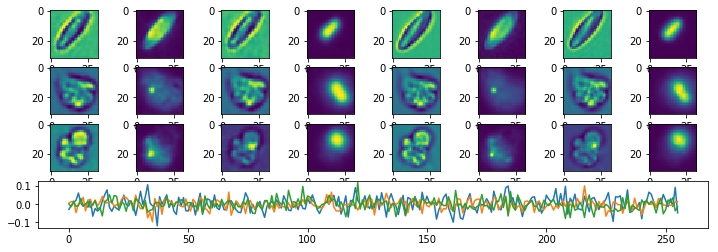

Epoch:  34 Iteration:  0 Loss:  4.464199 24.711987 0.3244443


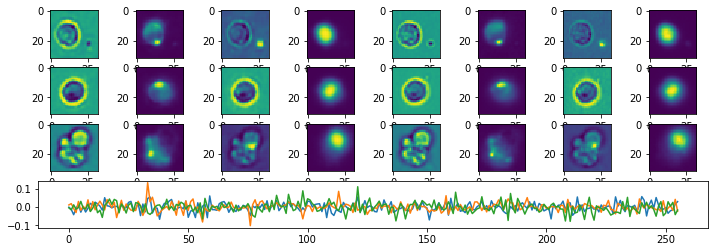

Epoch:  34 Iteration:  500 Loss:  4.1611357 22.998846 0.32284757


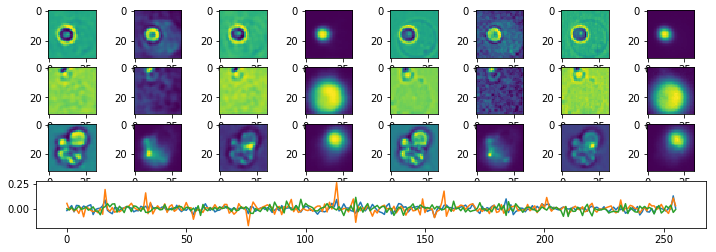

Epoch:  34 Iteration:  1000 Loss:  3.7505264 29.422297 0.31398907


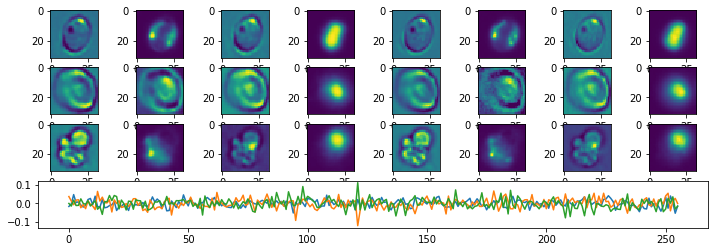

Epoch:  35 Iteration:  0 Loss:  4.119 21.287374 0.30988088


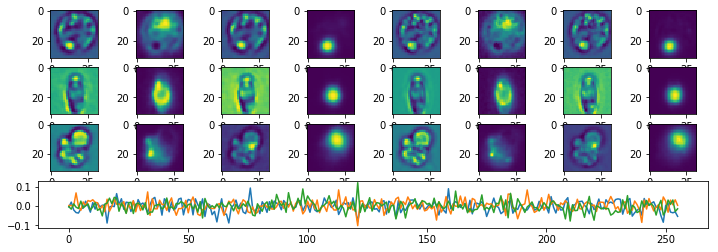

Epoch:  35 Iteration:  500 Loss:  3.7583997 27.541788 0.31114304


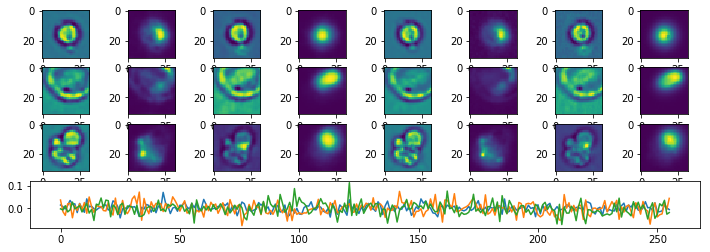

Epoch:  35 Iteration:  1000 Loss:  3.9428656 28.480595 0.29977223


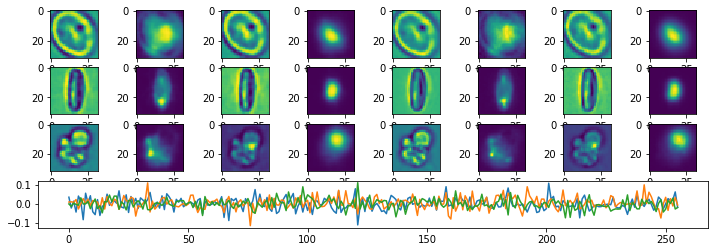

Epoch:  36 Iteration:  0 Loss:  5.078214 22.716059 0.30328467


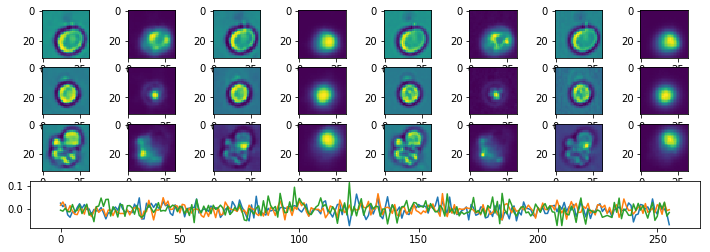

Epoch:  36 Iteration:  500 Loss:  4.5454993 19.88405 0.29600757


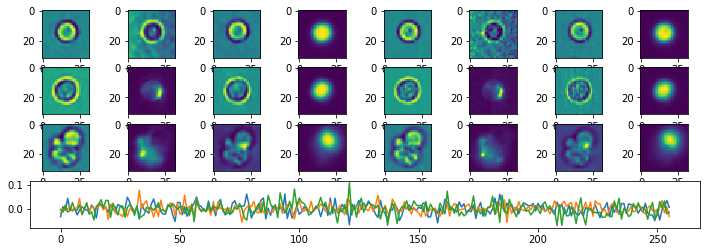

Epoch:  36 Iteration:  1000 Loss:  4.7046547 18.261578 0.28804243


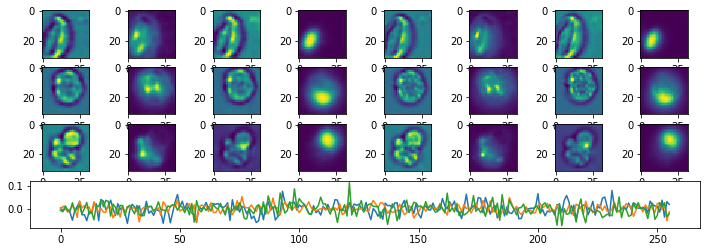

Epoch:  37 Iteration:  0 Loss:  4.455701 19.101135 0.28724456


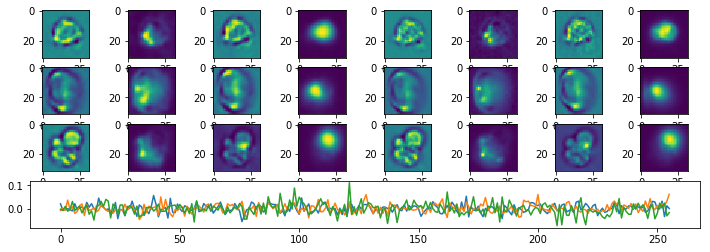

Epoch:  37 Iteration:  500 Loss:  4.5921144 22.363703 0.28973132


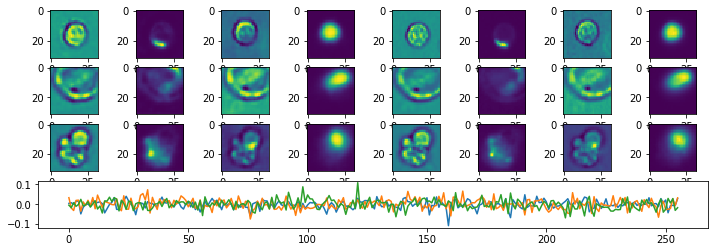

Epoch:  37 Iteration:  1000 Loss:  4.4954414 20.07887 0.2876991


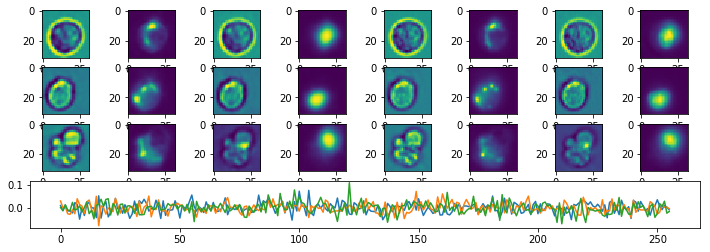

Epoch:  38 Iteration:  0 Loss:  3.9962106 28.399448 0.28321522


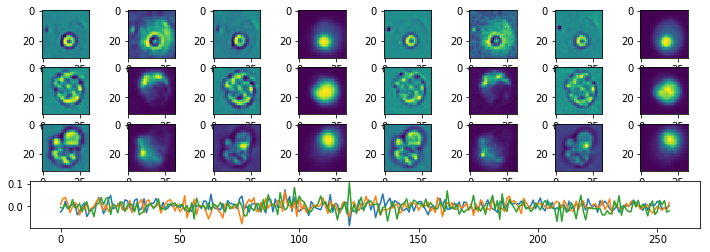

Epoch:  38 Iteration:  500 Loss:  4.080755 28.294857 0.2738415


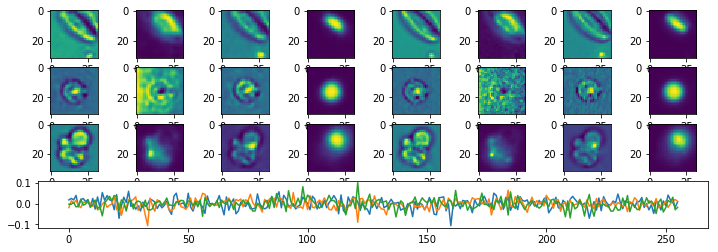

Epoch:  38 Iteration:  1000 Loss:  4.4129963 28.698166 0.28550538


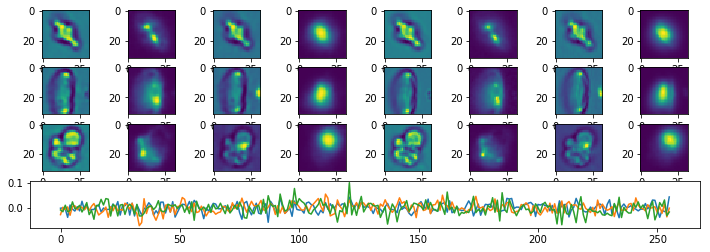

Epoch:  39 Iteration:  0 Loss:  4.0689926 23.293316 0.27878442


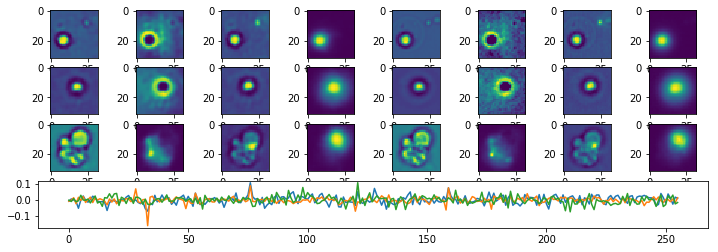

Epoch:  39 Iteration:  500 Loss:  3.981124 28.633337 0.27077845


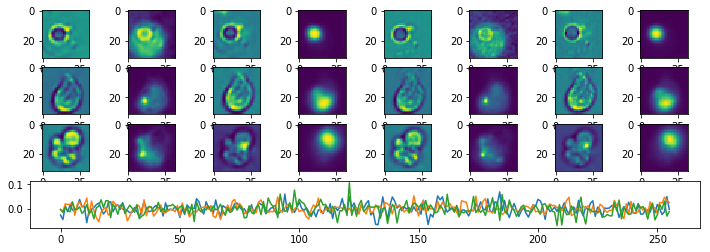

Epoch:  39 Iteration:  1000 Loss:  4.161374 23.248089 0.2702668


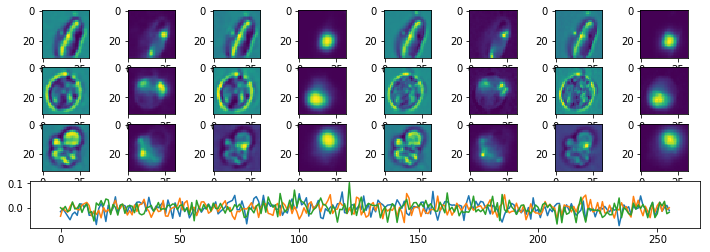

Done


In [4]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 40
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 256 #128 + 64
p_droprate = 0.95
p_stdev = .04
p_slam = .0005
p_denoise = None
enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev
params['slam'] = p_slam
params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes
params['denoise'] = p_denoise
cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-10-30-0"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [5]:
x = 4
x

4